In [1]:
# heatmaps for separate buildings scenario_2 (for CO2 emissions)

import pandas as pd
import folium
from folium.plugins import HeatMap
import branca.colormap
from collections import defaultdict
import io
import PIL
from PIL import Image
from IPython.display import Image
import matplotlib.pyplot as plt



hmap = folium.Map(location=[40.607421, 22.957578], zoom_start=13)

path = 'data_spreadsheet_directory'

for_map = pd.read_excel(path)

print(
    'Selection of buildings:\nManagement building = 1\nArchitecture = 2\nBuilding D = 3\nFaculty of Education = 4'
    '\nTheology = 5\nHydraulics Building = 6\nΕ13 Building = 7\nUniversity Gym = 8\nUniversity Student Club = 9')

building = int(input("Bulding selection (1-9): "))

print('Fuel selection:\nNatural Gas = 1\nHeating Oil = 2')

fuel = int(input("Fuel selection (1-2): "))

if fuel == 1:
    fuel = str('ng')
else:
    fuel = str('ho')

print('Pollutant selection:\nCO2 = 1\nCO = 2\nNOx = 3\nVOC = 4\nSOx = 5\nPM = 6')
pollutant = int(input("Pollutant selection (1-6): "))


if pollutant == 1:
    pollutant = str('CO2_')
elif pollutant == 2:
    pollutant = str('CO_')
elif pollutant == 3:
    pollutant = str('NOx_')
elif pollutant == 4:
    pollutant = str('VOC_')
elif pollutant == 5:
    pollutant = str('SOx_')
elif pollutant == 6:
    pollutant = str('PM_')
else:
    pollutant = str('error')

column = str(pollutant + fuel)

print(column)

max_amount = float(for_map['CO2_ho'].max())

print(max_amount)

for_map = for_map[(for_map['building'] == building)]

hm_wide = HeatMap( list(zip(for_map.Latitude.values, for_map.Longtitude.values, for_map[column].values)),
                   min_opacity=0.2,
                   max_val=max_amount,
                   radius=17, blur=8,
                   max_zoom=1,
                 )

steps=40
colormap = branca.colormap.linear.YlOrRd_09.scale(0, for_map[column].max()).to_step(steps)
gradient_map=defaultdict(dict)

for i in range(steps):
    gradient_map[1/steps*i] = colormap.rgb_hex_str(1/steps*i)
    
colormap.add_to(hmap)

final_map = hmap.add_child(hm_wide)

final_map

Selection of buildings:
Management building = 1
Architecture = 2
Building D = 3
Faculty of Education = 4
Theology = 5
Hydraulics Building = 6
Ε13 Building = 7
University Gym = 8
University Student Club = 9
Bulding selection (1-9): 2
Fuel selection:
Natural Gas = 1
Heating Oil = 2
Fuel selection (1-2): 1
Pollutant selection:
CO2 = 1
CO = 2
NOx = 3
VOC = 4
SOx = 5
PM = 6
Pollutant selection (1-6): 3
NOx_ng
3765.120601059377


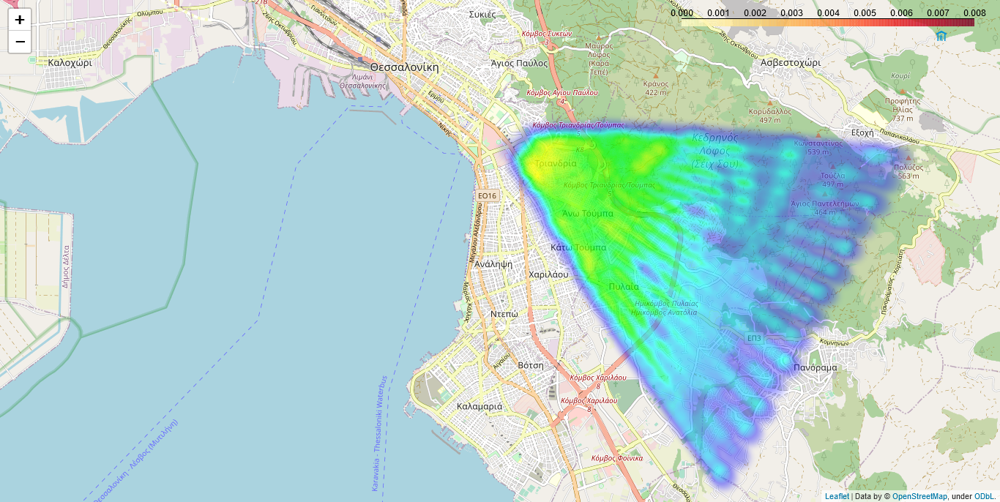

In [2]:
### in order to save the image of the heatmap produced geckodriver must be added in python path ###
### geckodriver is avilable in: https://github.com/mozilla/geckodriver/releases ###

### however it is better to take the image from Jupyter Notebook, in order to manipulate the heatmap accordingly ####

# Saving the heatmap in drive

img_data = final_map._to_png(5)
img = PIL.Image.open(io.BytesIO(img_data))
img.save('final_map.png')
display(PIL.Image.open('final_map.png'))

In [3]:
# maps for all buildings scenario 2 (for NOx emissions)

hmap = folium.Map(location=[40.607421, 22.957578], zoom_start=13)

path = 'data_spreadsheet_directory'

for_map = pd.read_excel(path)


print('Fuel selection:\nNatural Gas = 1\nHeating Oil = 2')
fuel = int(input("Fuel selection (1-2): "))

if fuel == 1:
    fuel = str('ng')
else:
    fuel = str('ho')

print('Pollutant selection:\nCO2 = 1\nCO = 2\nNOx = 3\nVOC = 4\nSOx = 5\nPM = 6')
pollutant = int(input("Pollutant selection (1-6): "))


if pollutant == 1:
    pollutant = str('CO2_')
elif pollutant == 2:
    pollutant = str('CO_')
elif pollutant == 3:
    pollutant = str('NOx_')
elif pollutant == 4:
    pollutant = str('VOC_')
elif pollutant == 5:
    pollutant = str('SOx_')
elif pollutant == 6:
    pollutant = str('PM_')
else:
    pollutant = str('error')

column = str(pollutant + fuel)

print(column)

max_amount = float(for_map['NOx_ho'].max())
print(max_amount)

hm_wide = HeatMap( list(zip(for_map.Latitude.values, for_map.Longtitude.values, for_map[column].values)),
                   min_opacity=0.2,
                   max_val=max_amount,
                   radius=17, blur=10,
                   max_zoom=1,
                 )


steps=20
colormap = branca.colormap.linear.YlOrRd_09.scale(0, for_map[column].max()).to_step(steps)
gradient_map=defaultdict(dict)

hmap.add_child(hm_wide)

for i in range(steps):
    gradient_map[1/steps*i] = colormap.rgb_hex_str(1/steps*i)
    
colormap.add_to(hmap)

total_map = hmap.add_child(hm_wide)

total_map

Fuel selection:
Natural Gas = 1
Heating Oil = 2
Fuel selection (1-2): 1
Pollutant selection:
CO2 = 1
CO = 2
NOx = 3
VOC = 4
SOx = 5
PM = 6
Pollutant selection (1-6): 3
NOx_ng
47.92998525148587


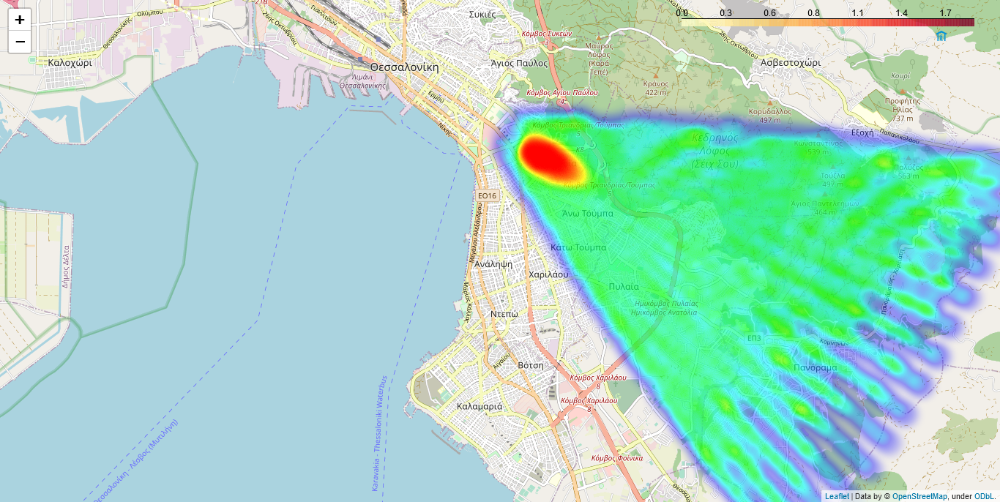

In [4]:
# Saving the heatmap in drive

img_data = total_map._to_png(5)
img = PIL.Image.open(io.BytesIO(img_data))
img.save('total_map.png')
display(PIL.Image.open('total_map.png'))

In [5]:
# points of maxes in map, scenario_2

hmap = folium.Map(location=[40.607421, 22.957578], zoom_start=13)
path = 'data_spreadsheet_directory'

for_map = pd.read_excel(path)

df_max = pd.DataFrame()
df_building = pd.DataFrame()

for building in range(1,10):
    df_building = for_map[(for_map['building'] == building)]
    df_building = df_building[df_building.NOx_ng == df_building.NOx_ng.max()]
    df_max = df_max.append(df_building)
    
df_max = df_max.drop_duplicates('building')
locations = df_max[['Latitude', 'Longtitude']]
locationlist = locations.values.tolist()

points_map = folium.Map(location=[40.607421, 22.957578], zoom_start=13)

for point in range(0, 9):
    folium.Marker(locationlist[point]).add_to(points_map)
    
points_map

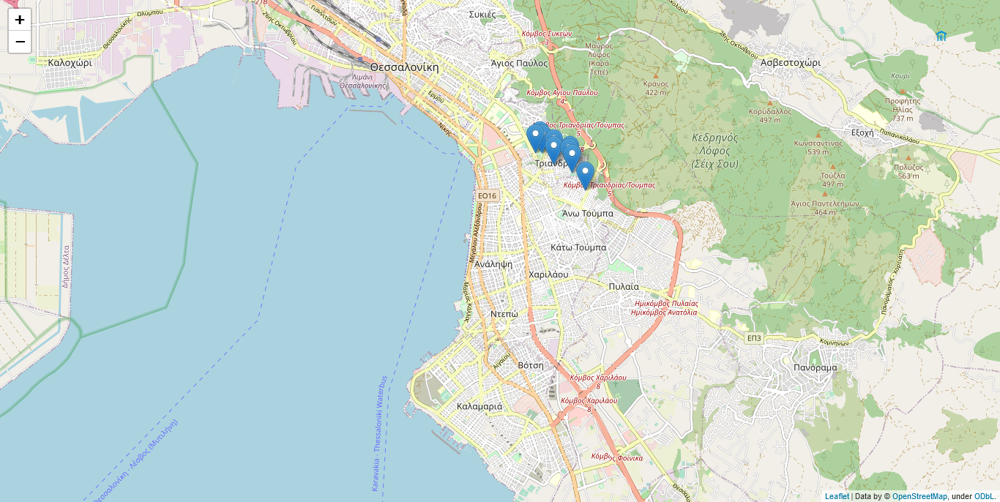

In [6]:
# Saving the concentration maxes map in drive

img_data = points_map._to_png(5)
img = PIL.Image.open(io.BytesIO(img_data))
img.save('points_map.png')
display(PIL.Image.open('points_map.png'))

In [7]:
# Display a list of the coordinates of the max values resulting from each building under analysis

locationlist

[[40.622618, 22.974025],
 [40.621274, 22.974437],
 [40.622656, 22.970162],
 [40.624807, 22.967378],
 [40.62386, 22.970168],
 [40.625285, 22.966897],
 [40.624809, 22.965884],
 [40.622339, 22.973853],
 [40.618176, 22.977545]]

Selection of buildings:
Management building = 1
Architecture = 2
Building D = 3
Faculty of Education = 4
Theology = 5
Hydraulics Building = 6
Ε13 Building = 7
University Gym = 8
University Student Club = 9: 7
Pollutant selection:
CO2 = 1
CO = 2
NOx = 3
VOC = 4
SOx = 5
PM = 6
Pollutant selection (1-6): 3


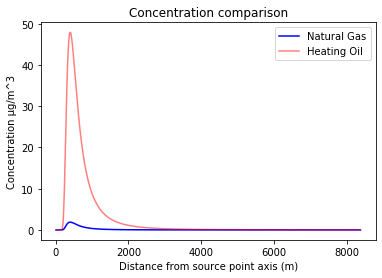

In [8]:
# plot for concentration - distance from point source, for each building - scenario 2

path = 'data_spreadsheet_directory'

for_map = pd.read_excel(path)

df_building = pd.DataFrame()


building = int((input('Selection of buildings:\nManagement building = 1\nArchitecture = 2\nBuilding D = 3\nFaculty of Education = 4'
    '\nTheology = 5\nHydraulics Building = 6\nΕ13 Building = 7\nUniversity Gym = 8\nUniversity Student Club = 9: ')))

for_map = for_map[(for_map['building'] == building)]
df_building = for_map[(for_map['Distance_y(m)'] == 0)]
df_building = df_building.drop_duplicates('Distance_x (m)')

print('Pollutant selection:\nCO2 = 1\nCO = 2\nNOx = 3\nVOC = 4\nSOx = 5\nPM = 6')
pollutant = int(input("Pollutant selection (1-6): "))

if pollutant == 1:
    pollutant = str('CO2_')
elif pollutant == 2:
    pollutant = str('CO_')
elif pollutant == 3:
    pollutant = str('NOx_')
elif pollutant == 4:
    pollutant = str('VOC_')
elif pollutant == 5:
    pollutant = str('SOx_')
elif pollutant == 6:
    pollutant = str('PM_')
else:
    pollutant = str('error')

column_ng = str(pollutant + 'ng')
column_ho = str(pollutant + 'ho')

line_C_ng = []
line_C_ho = []
line_dist = []
line_C_ng = df_building[column_ng].tolist()
line_C_ho = df_building[column_ho].tolist() 
line_dist = df_building['Distance_x (m)'].tolist()

plt.plot(line_dist, line_C_ng, color='b')
plt.plot(line_dist, line_C_ho, color='r', alpha=0.5)

plt.xlabel('Distance from source point axis (m)')
plt.ylabel('Concentration μg/m^3')
plt.title("Concentration comparison")
plt.legend(["Natural Gas","Heating Oil"])
plt.show()

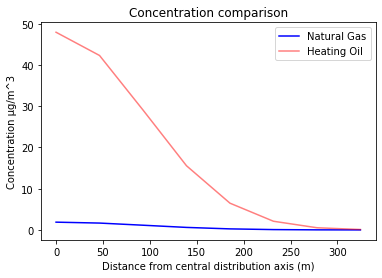

In [9]:
# Hydraulics Building in the point of max concentration: variation of concentration - distance from central axis

line_distance_y = [0,46.35603347,92.71206694,139.0681004,185.4241339,231.7801674,278.1362008,324.4922343]
line_C_ng = [1.885061135,1.663560612,1.143347374,0.611989748,0.255115283,0.082823806,0.020941138,0.004123554]
line_C_ho = [47.92998525,42.29806353,29.07100557,15.56058797,6.48661813,2.105896581,0.53245404,0.104846417]


plt.plot(line_distance_y, line_C_ng, color='b')
plt.plot(line_distance_y, line_C_ho, color='r', alpha=0.5)
plt.xlabel('Distance from central distribution axis (m)')
plt.ylabel('Concentration μg/m^3')
plt.title("Concentration comparison")
plt.legend(["Natural Gas","Heating Oil"])
plt.show()